# PyTorch Metric Learning on Papyri Data

## Prepare

### 0 - Mount Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


### 1 - Install the necessary packages

In [ ]:
!pip install -q pytorch-metric-learning[with-hooks]==1.1.1
!pip install umap-learn
!pip install gpustat
!pip install toml

     |████████████████████████████████| 106 kB 3.9 MB/s 
     |████████████████████████████████| 85.5 MB 1.1 MB/s 
     |████████████████████████████████| 86 kB 3.1 MB/s 
     |████████████████████████████████| 1.1 MB 22.8 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82708 sha256=b675695e031c723a8212c240e0ed843d6e137913baecd83350b17ac6ef79b255
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.6-py3-none-any.whl size=53943 sha256=770233d41a96694d545130d8c76693169c4346be88df1bdb5f0ddff1a5f765d3
  Stored in directory: /root/.cache/pip/wheels/03/f1/56/f80d72741e400345b5a5b50ec3d929aca581bf45e0225d5c50
Successfully built umap-learn pynndescent
     |████████████████████████████████| 78 kB 3.6 MB/s 
  Created wheel for gpustat: filename=gpustat-0.6.0-py3-none-any.whl size=12617 sha256=16a90fe93a2a8a0181f5a6b0af14feffe2313e689f217d88f27bb2

### 2 - Load the required data 

In [ ]:
!cp gdrive/My\ Drive//mt/src/helpers.py .
!cp gdrive/My\ Drive//mt/src/models.py .
!cp gdrive/My\ Drive//mt/src/features.py .
!cp gdrive/My\ Drive//mt/src/netvlad.py .
!cp gdrive/My\ Drive//mt/src/densenet.py .
!pip install torchsummaryX

In [ ]:
from pathlib import Path

train_data = Path("./7_baseline_big_big.zip/")

if not train_data.is_dir():
    !unzip gdrive/My\ Drive//mt/data/7_baseline_big_big.zip
    !unzip gdrive/My\ Drive//mt/data/val_cleansed.zip

Streaming output truncated to the last 5000 lines.
  inflating: 5_baseline_big_big/val/170480_170480_0_16.png  
  inflating: 5_baseline_big_big/val/147220_147220_2_5.png  
  inflating: 5_baseline_big_big/val/185531_185531_0_0.png  
  inflating: 5_baseline_big_big/val/130700_130700_3_8.png  
  inflating: 5_baseline_big_big/val/151681_151681_9_7.png  
  inflating: 5_baseline_big_big/val/149611_149611_0_13.png  
  inflating: 5_baseline_big_big/val/126101_126101_10_12.png  
  inflating: 5_baseline_big_big/val/131770_131770_1_15.png  
  inflating: 5_baseline_big_big/val/139591_139591_2_3.png  
  inflating: 5_baseline_big_big/val/141380_141380_3_16.png  
  inflating: 5_baseline_big_big/val/168480_168480_1_9.png  
  inflating: 5_baseline_big_big/val/167901_167901_1_5.png  
  inflating: 5_baseline_big_big/val/181620_181620_1_15.png  
  inflating: 5_baseline_big_big/val/49791_49791_0_0.png  
  inflating: 5_baseline_big_big/val/116370_116370_1_11.png  
  inflating: 5_baseline_big_big/val/127520_

### 3 - Import packages

In [ ]:
import logging
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import record_keeper
import torch
import torch.nn as nn
import torchvision
import umap
import toml
from cycler import cycler
import PIL
from PIL import Image
from torchvision import datasets, transforms
import pytorch_metric_learning
import pytorch_metric_learning.utils.logging_presets as logging_presets
from pytorch_metric_learning import losses, miners, samplers, testers, trainers, distances
from pytorch_metric_learning.utils import common_functions
from pytorch_metric_learning.utils.accuracy_calculator import AccuracyCalculator
from pytorch_metric_learning.distances import CosineSimilarity
from pytorch_metric_learning.utils import common_functions as c_f
from pytorch_metric_learning.utils.inference import InferenceModel, MatchFinder
import os
from torchsummaryX import summary
import helpers
import models
import features
from skimage import io
from skimage import img_as_ubyte
#import netvlad
from netvlad import NetVLAD
from netvlad import EmbedNet
#import densenet

### 4 - Initialize Notebook



```
# This is formatted as code
```

### 5 - Load settings

In [ ]:
config = toml.load('./gdrive/MyDrive/mt/conf/conf.toml')
setting = config.get('settings')
param = config.get('params')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### 6 - Create directory for results

In [ ]:
output_dir = helpers.create_output_dir(setting['output'], setting['experiment_name'])

### 7 - Save config

In [ ]:
!mkdir $output_dir/config/
!cp ./gdrive/MyDrive/mt/conf/conf.toml $output_dir/config/conf.toml

### 8 - Create fir for UMAPs

In [ ]:
!mkdir ./umap_train/
!mkdir ./umap_val/

### 9 - Initialize Logger

In [ ]:
logging.getLogger().setLevel(logging.INFO)
logging.info("VERSION %s" % pytorch_metric_learning.__version__)

INFO:root:VERSION 1.1.1


### 10 - Initilize Trunk Model

In [ ]:
from torch import Tensor
from typing import Any, List, Tuple
import torch.nn.functional as F

class MyDenseNet(torchvision.models.densenet.DenseNet):
    def forward(self, x: Tensor) -> Tensor:
        features = self.features(x)
        out = F.relu(features, inplace=True)
        return out

In [ ]:
def _densenet(
    arch: str,
    growth_rate: int,
    block_config: Tuple[int, int, int, int],
    num_init_features: int,
    pretrained: bool,
    progress: bool,
    **kwargs: Any,
) -> MyDenseNet:
    model = MyDenseNet(growth_rate, block_config, num_init_features, **kwargs)
    if pretrained:
        _print('NotImplementeYet')
    return model


In [ ]:
def densenet121(pretrained: bool = False, progress: bool = True, **kwargs: Any) -> MyDenseNet:
    r"""Densenet-121 model from
    `"Densely Connected Convolutional Networks" <https://arxiv.org/pdf/1608.06993.pdf>`_.
    The required minimum input size of the model is 29x29.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
        memory_efficient (bool) - If True, uses checkpointing. Much more memory efficient,
          but slower. Default: *False*. See `"paper" <https://arxiv.org/pdf/1707.06990.pdf>`_.
    """
    return _densenet("densenet121", 32, (6, 12, 24, 16), 64, pretrained, progress, **kwargs)

In [ ]:
class EmbedNet(nn.Module):
    def __init__(self, base_model, net_vlad):
        super(EmbedNet, self).__init__()
        self.base_model = base_model
        self.net_vlad = net_vlad

    def forward(self, x):
        x = self.base_model(x)
        #print(x.shape)
        embedded_x = self.net_vlad(x)
        #print(embedded_x.shape)
        return embedded_x

In [ ]:
# Set trunk model and replace the softmax layer with an identity function

if param['trunk'] == 'efficientnet_b0':
    #trunk = torchvision.models.efficientnet_b0(pretrained=False)
    trunk = EfficientNet.from_name('efficientnet-b0')    
    trunk_output_size = trunk._fc.in_features
    trunk._fc = common_functions.Identity()    
elif param['trunk'] == 'resnet50':
    trunk = torchvision.models.resnet50(pretrained=False)
    trunk_output_size = trunk.fc.in_features
    trunk.fc = common_functions.Identity()
elif param['trunk'] == 'resnet34':
    trunk = torchvision.models.resnet34(pretrained=False)
    trunk_output_size = trunk.fc.in_features
    trunk.fc = common_functions.Identity()
elif param['trunk'] == 'resnet18':
    trunk = torchvision.models.resnet18(pretrained=False)
    trunk_output_size = trunk.fc.in_features
    trunk.fc = common_functions.Identity()
elif param['trunk'] == 'densenet161':
    trunk = torchvision.models.densenet161(pretrained=False)
    trunk_output_size = trunk.classifier.in_features
    trunk.classifier = common_functions.Identity() 
elif param['trunk'] == 'densenet121':
    if param['vlad'] == 'yes':
        trunk = densenet121(pretrained=False)
        trunk_output_size = trunk.classifier.in_features
        net_vlad = NetVLAD(num_clusters=1, dim=1024, alpha=1.0)
        trunk = EmbedNet(trunk, net_vlad)
    else:
        trunk = torchvision.models.densenet121(pretrained=False)
        trunk_output_size = trunk.classifier.in_features
        trunk.classifier = common_functions.Identity() 
    
trunk = trunk.to(device) 

In [ ]:
#summary(trunk, torch.zeros((1, 3, 224, 224)))

In [ ]:
trunk_output_size

1024

In [ ]:
trunk_optimizer = torch.optim.Adam(
    trunk.parameters(), lr=param['trunk_optimizer_lr'])

In [ ]:
if False:
    base_model = nn.Sequential(
        trunk.features.conv0,
        trunk.features.norm0, 
        trunk.features.relu0,
        trunk.features.pool0,
        trunk.features.denseblock1,
        trunk.features.transition1,
        trunk.features.denseblock2,
        trunk.features.transition2,
        trunk.features.denseblock3,
    )
    #dim = list(base_model.parameters())[-1].shape[0]  # last channels (512)
    #dim
    net_vlad = NetVLAD(num_clusters=32, dim=trunk_output_size, alpha=1.0)
    trunk = EmbedNet(base_model, net_vlad)
    summary(trunk, torch.zeros((1, 3, 224, 224)))
    #trunk = trunk.to(device)

### 11 - Initilize Embedder Model

In [ ]:
# Set embedder model. This takes in the output of the trunk and outputs 64 dimensional embeddings
embedder = models.MLP([trunk_output_size, param['embedding_space']]).to(device)

In [ ]:
embedder_optimizer = torch.optim.Adam(
    embedder.parameters(), lr=param['embedder_optimizer_lr'])

### 12 - Initilize Classifier Model

In [ ]:
# Set the classifier. The classifier will take the embeddings and output a 50 dimensional vector.
# (Our training set will consist of the first 50 classes of the CIFAR100 dataset.)
# We'll specify the classification loss further down in the code.
classifier = models.MLP([param['embedding_space'], param['classes']]).to(device)

In [ ]:
classifier_optimizer = torch.optim.Adam(
    classifier.parameters(),
    lr=param['classifier_optimizer_lr'],
    weight_decay=param['classifier_optimizer_weight_decay'])

### 13 - Initialize Data Transformations

In [ ]:
train_transform = transforms.Compose([
    transforms.RandomVerticalFlip(0.5), 
    transforms.RandomHorizontalFlip(0.5),           
    transforms.ColorJitter(brightness=0.075, contrast=0.075, saturation=0.075, hue=0.075),                                      
    transforms.PILToTensor(),
    transforms.ConvertImageDtype(torch.float),
    transforms.Normalize((param['normalize_1'], param['normalize_2'], param['normalize_3']),
                        (param['normalize_4'], param['normalize_5'], param['normalize_6']))]
)

val_transform = transforms.Compose([
    transforms.PILToTensor(),
    transforms.ConvertImageDtype(torch.float),
    transforms.Normalize((param['normalize_1'], param['normalize_2'], param['normalize_3']),
                        (param['normalize_4'], param['normalize_5'], param['normalize_6']))]
)

### 14 - Initilize Datasets

In [ ]:
train_dataset = features.PypyrusDataset(data=setting['path_train'],
                               csv=setting['train_csv'],                               
                               transform=train_transform,
                               unpatched=False)

val_dataset = features.PypyrusDataset(data=setting['path_test'],
                               csv=setting['test_csv'],
                               transform=val_transform,
                               unpatched=False)

### 15 - Initialize Loss Function


In [ ]:
# Set the loss function
if param['metric_loss'] == 'TripletMarginLoss':
    loss = losses.TripletMarginLoss(margin=0.05,smooth_loss=False)
elif param['metric_loss'] == 'CentroidTripletLoss':
    loss = losses.CentroidTripletLoss(margin=0.1)
elif param['metric_loss'] == 'AngularLoss':
    loss = losses.AngularLoss(alpha=40)
elif param['metric_loss'] == 'MultiSimilarityLoss':
    loss = losses.MultiSimilarityLoss(alpha=2, beta=50, base=0.5)

# Set the classification loss:
classification_loss = torch.nn.CrossEntropyLoss()

### 16 - Initialize miner/ sampler

In [ ]:
# Set the mining function
if param['miner'] == 'MultiSimilarityMiner':
    miner = miners.MultiSimilarityMiner(epsilon=0.1)
elif param['miner'] == 'TripletMarginMiner':
    miner = miners.TripletMarginMiner(margin=0.2, type_of_triplets="all")
elif param['miner'] == 'AngularMiner':
    miner = miners.AngularMiner(angle=20)
# Set the dataloader sampler
sampler = samplers.MPerClassSampler(train_dataset.targets, m=4, length_before_new_iter=len(train_dataset))

### 17 - Set hyperparameters 

In [ ]:
batch_size = param['batch_size']
num_epochs = param['num_epochs']

### 18 -  Prepare Dictionaries

In [ ]:
# Package the above stuff into dictionaries.
models_dict = {"trunk": trunk, "embedder": embedder, "classifier": classifier}
optimizers = {
    "trunk_optimizer": trunk_optimizer,
    "embedder_optimizer": embedder_optimizer,
    "classifier_optimizer": classifier_optimizer,
}
loss_funcs = {"metric_loss": loss, "classifier_loss": classification_loss}
mining_funcs = {"tuple_miner": miner}

### 19 -  Specify loss weights

In [ ]:
loss_weights = {"metric_loss": 1, "classifier_loss": 0.5}

### 20 - Get tensorboard-records

In [ ]:
record_keeper, _, _ = logging_presets.get_record_keeper(
    output_dir + "/logs", output_dir + "/tensorboard"
)
hooks = logging_presets.get_hook_container(record_keeper, primary_metric='precision_at_1')
dataset_dict = {"train":train_dataset,"val": val_dataset}
model_folder = output_dir + "/saved_models"

### 21 - Create Deep Metric Tester

In [ ]:
tester = testers.GlobalEmbeddingSpaceTester(
    end_of_testing_hook=hooks.end_of_testing_hook,
    visualizer=umap.UMAP(),
    visualizer_hook=helpers.visualizer_hook,
    dataloader_num_workers=2,
    accuracy_calculator=AccuracyCalculator(k="max_bin_count", avg_of_avgs=True, exclude=['mean_average_precision_at_r', 'r_precision']),
    set_min_label_to_zero=True,
    dataset_labels = np.hstack((np.unique(train_dataset.targets) , np.unique(val_dataset.targets))),
)

### 22 - Initialie Tester Hook

In [ ]:
end_of_epoch_hook = hooks.end_of_epoch_hook(
    tester, dataset_dict, model_folder, test_interval=param['test_interval'], patience=param['patience']
)

### 23 - Initialize Scheduler 


In [ ]:
lr_schedulers_dict = {"trunk_scheduler_by_epoch": torch.optim.lr_scheduler.StepLR(trunk_optimizer, step_size=3, gamma=0.4),
                     "embedder_scheduler_by_epoch": torch.optim.lr_scheduler.StepLR(embedder_optimizer, step_size=3, gamma=0.4),
                     #"classifier_embedder_scheduler_by_epoch": torch.optim.lr_scheduler.StepLR(classifier_optimizer, step_size=5, gamma=0.2),
                      }

### 24 - Initialize Final DML Trainer

In [ ]:
trainer = trainers.TrainWithClassifier(
    models_dict,
    optimizers,
    batch_size,
    loss_funcs,    
    {},
    train_dataset,
    set_min_label_to_zero = True,
    lr_schedulers = lr_schedulers_dict,
    dataset_labels = np.unique(train_dataset.targets),
    dataloader_num_workers=2,
    loss_weights=loss_weights,
    end_of_iteration_hook=hooks.end_of_iteration_hook,
    end_of_epoch_hook=end_of_epoch_hook,
)

## Training

INFO:PML:Initializing dataloader
INFO:PML:Initializing dataloader iterator
INFO:PML:Done creating dataloader iterator
INFO:PML:TRAINING EPOCH 1
total_loss=2.30389: 100%|██████████| 462/462 [04:00<00:00,  1.92it/s]
INFO:PML:Evaluating epoch 1
INFO:PML:Getting embeddings for the train split
100%|██████████| 926/926 [03:01<00:00,  5.09it/s]
INFO:PML:Getting embeddings for the val split
100%|██████████| 470/470 [00:52<00:00,  9.02it/s]
INFO:PML:Running UMAP on the train set
/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
INFO:PML:Finished UMAP
INFO:root:UMAP plot for the train split and label set UMAP_level0
INFO:PML:Running UMAP on the val set
INFO:PML:Finished UMAP
INFO:root:UMAP plot for the val split and label set UMAP_level0
INFO:PML:Computing accuracy fo

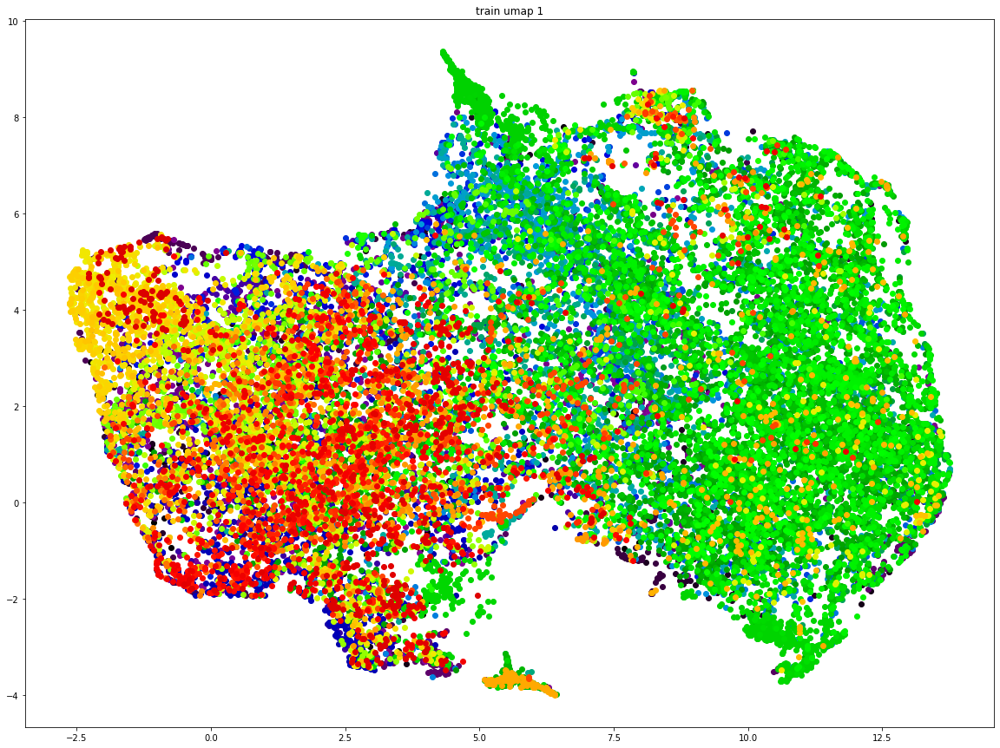

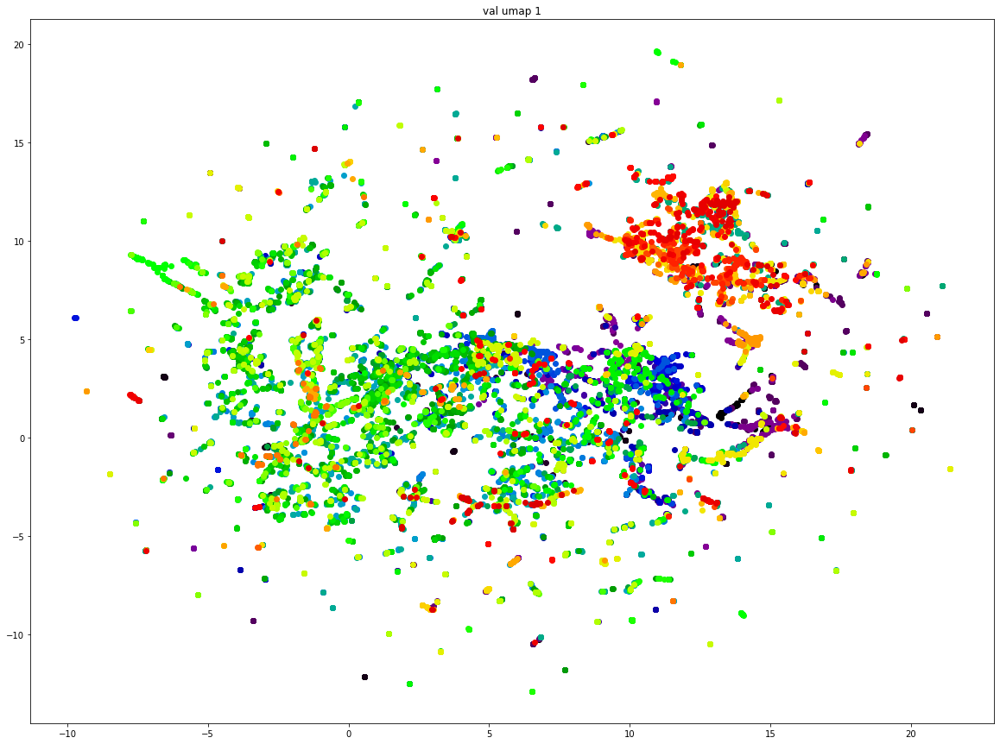

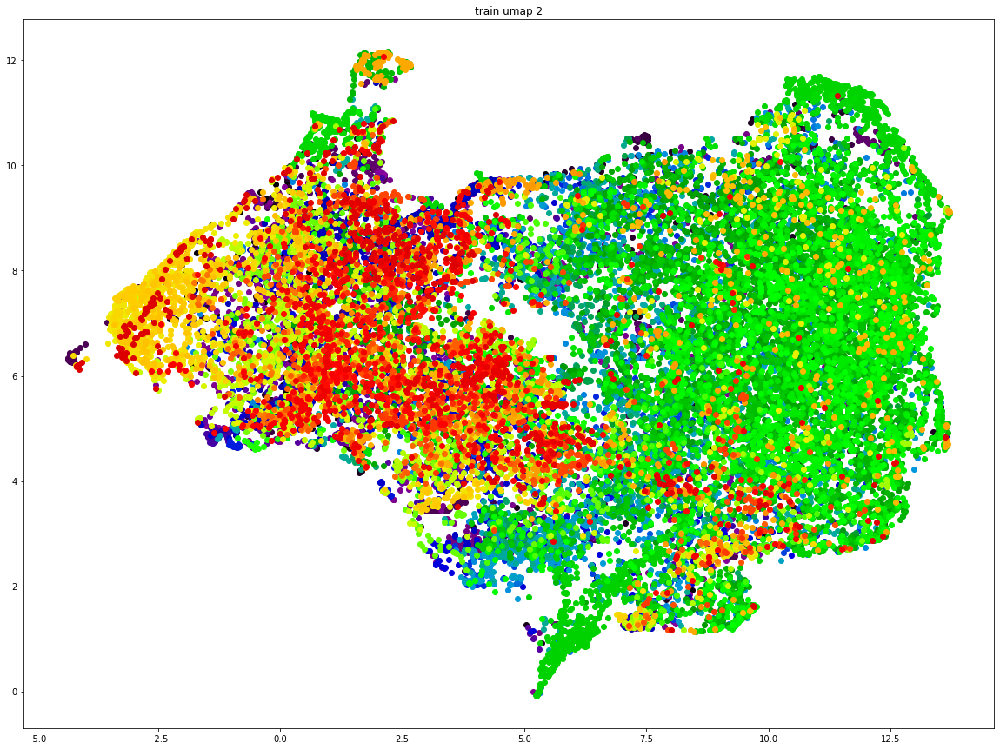

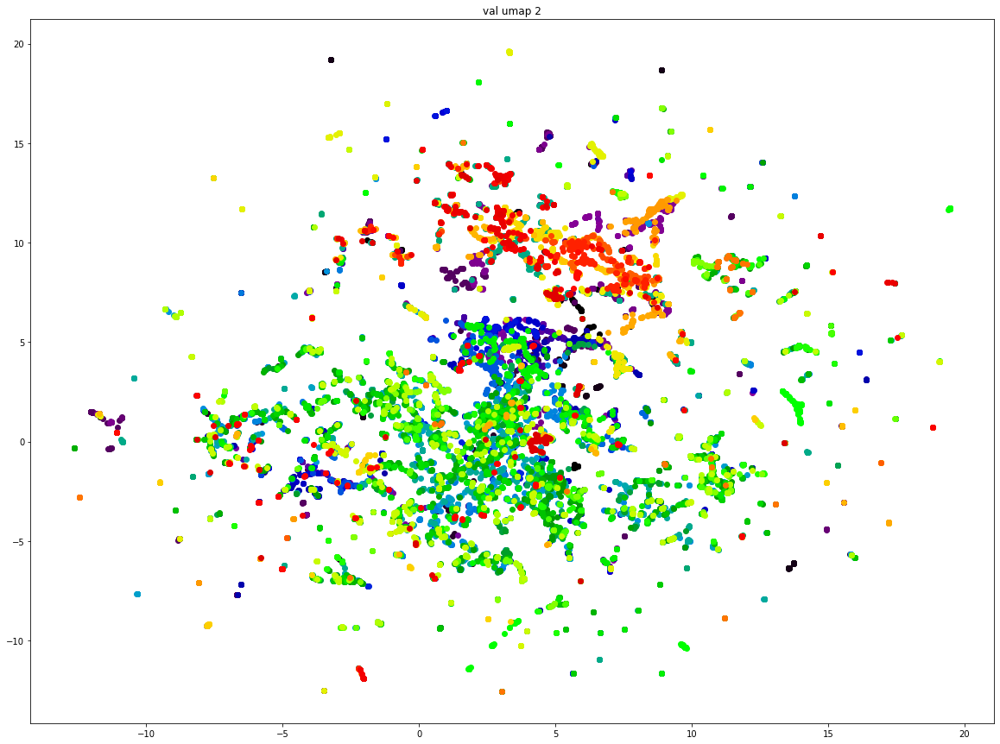

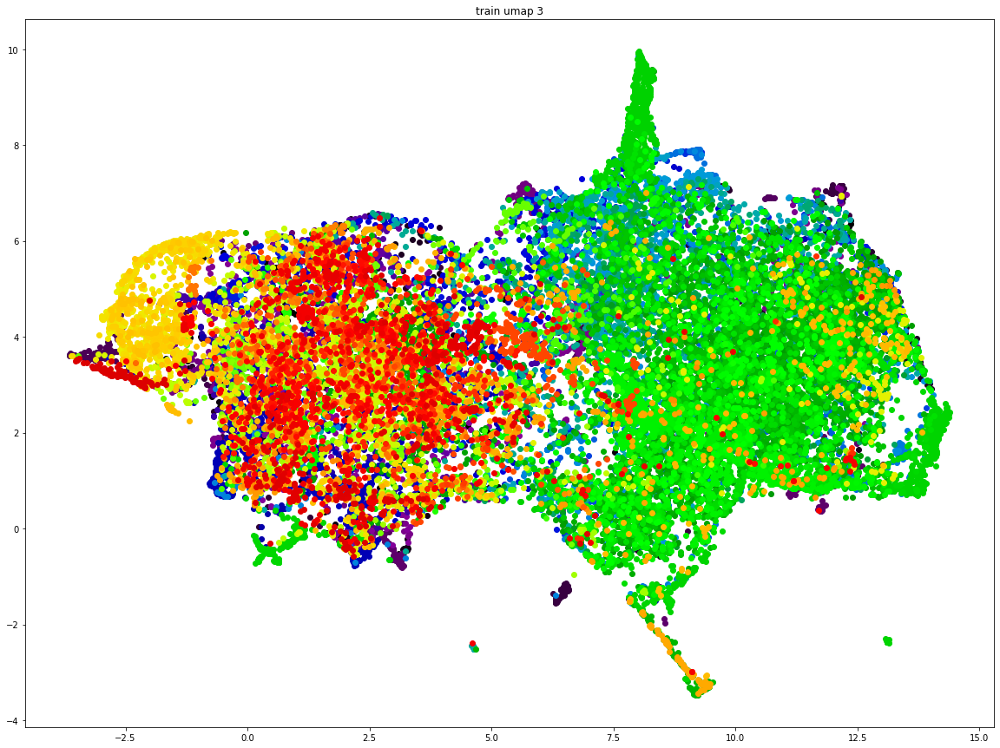

...

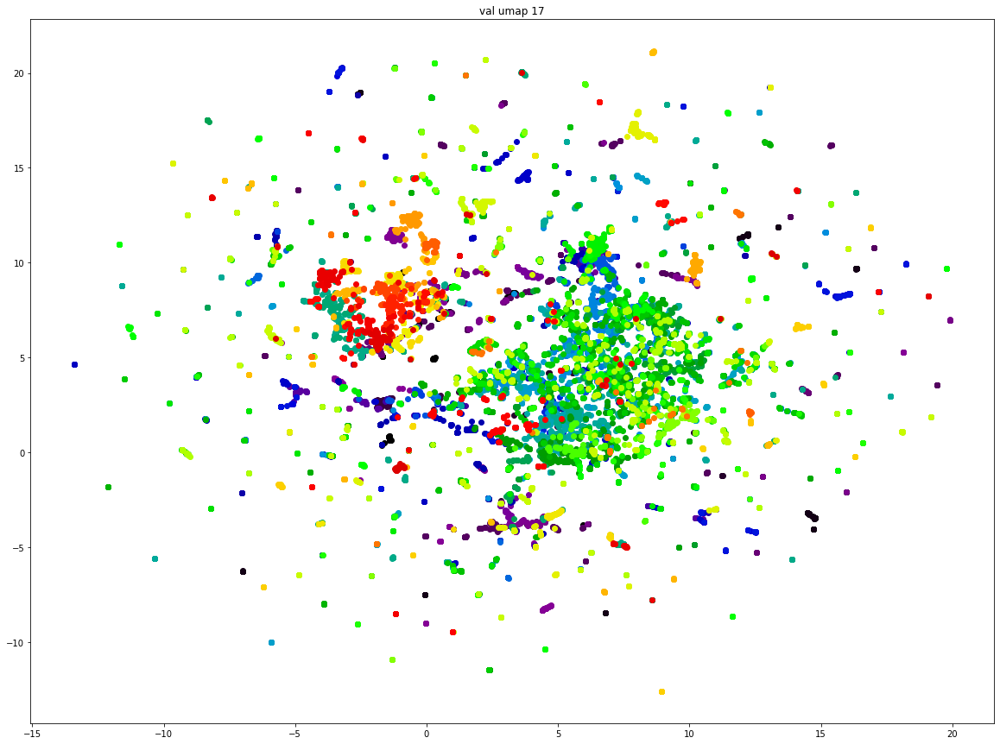

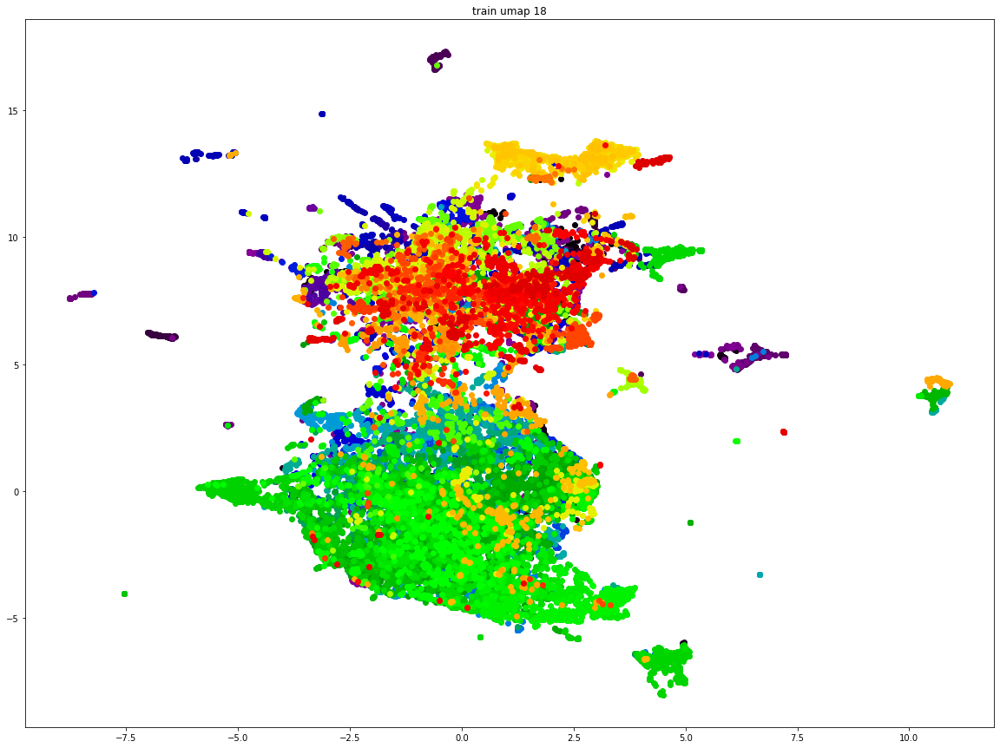

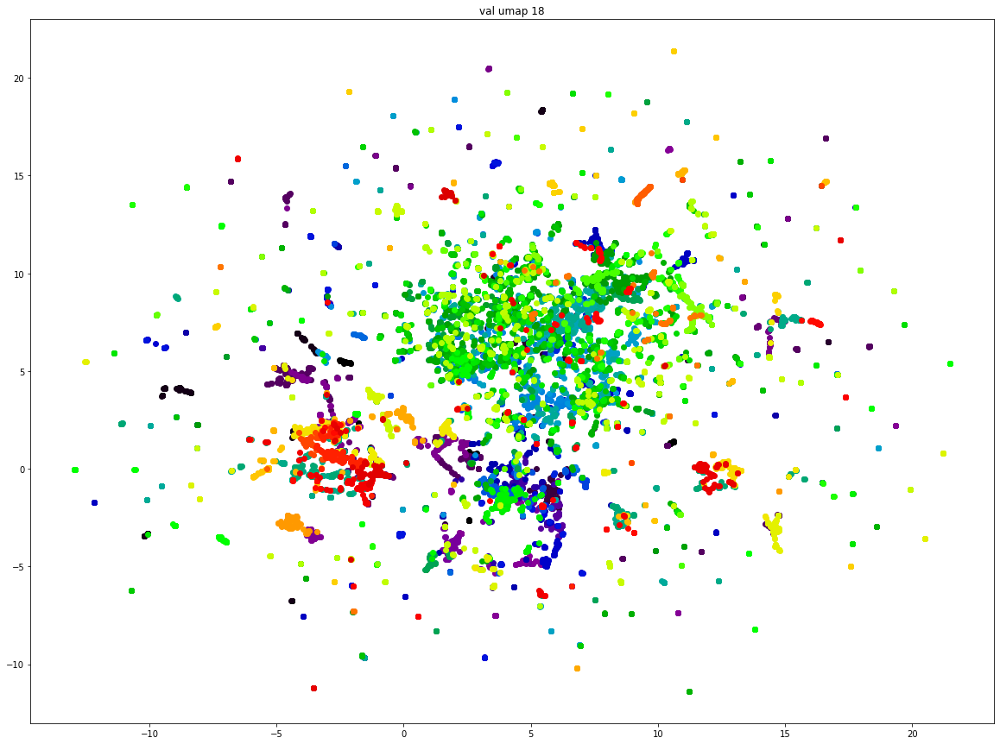

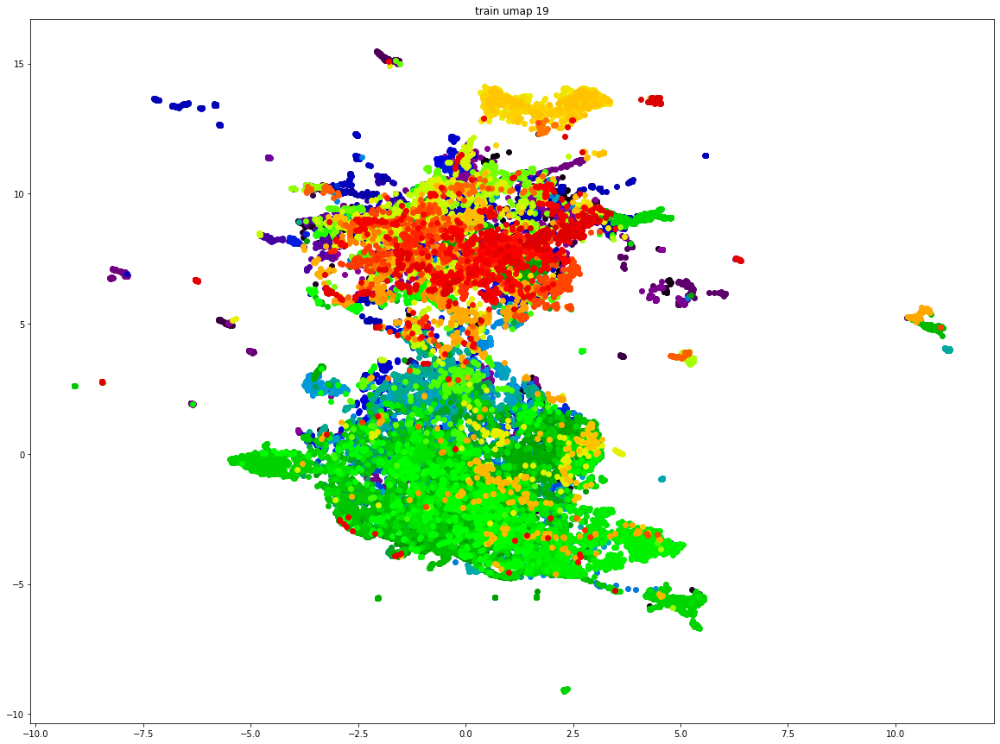

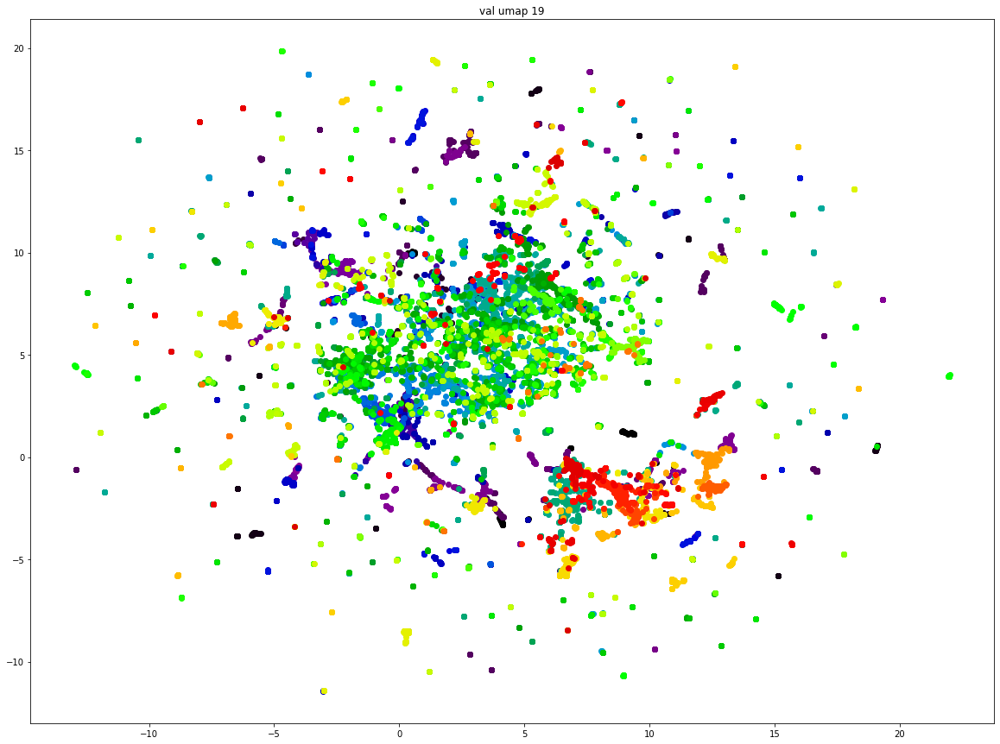

In [ ]:
trainer.train(num_epochs=num_epochs)

In [ ]:
!cp -R ./umap_train/ $output_dir
!cp -R ./umap_val/ $output_dir

## Validation

### 0 - Get best model

In [ ]:
#output_dir = './gdrive/MyDrive/mt/out/5_baseline_big_big'

In [ ]:
p = Path(output_dir + '/saved_models/').glob('**/trunk_best*')
trunk_model = [x for x in p if x.is_file()][0]
p = Path(output_dir + '/saved_models/').glob('**/embedder_best*')
embedder_model = [x for x in p if x.is_file()][0]
p = Path(output_dir + '/saved_models/').glob('**/classifier_best*')
classifier_model = [x for x in p if x.is_file()][0]

In [ ]:
embedder.load_state_dict(torch.load(embedder_model))

<All keys matched successfully>

In [ ]:
trunk.load_state_dict(torch.load(trunk_model))

<All keys matched successfully>

### 1 - Patch level

In [ ]:
final_tester = testers.GlobalEmbeddingSpaceTester(
    dataloader_num_workers=2,
    accuracy_calculator=AccuracyCalculator(k="max_bin_count", return_per_class=True, exclude=['mean_average_precision_at_r', 'r_precision']),
    set_min_label_to_zero=True,
    dataset_labels = np.unique(val_dataset.targets),
)

In [ ]:
all_accuracies = final_tester.test(
    {"val": val_dataset}, # dictionary mapping strings to datasets
    1, # used for logging
    trunk,
    embedder
)

INFO:PML:Evaluating epoch 1
INFO:PML:Getting embeddings for the val split
100%|██████████| 470/470 [00:50<00:00,  9.29it/s]
INFO:PML:Computing accuracy for the val split w.r.t ['val']
INFO:PML:running k-nn with k=520
INFO:PML:embedding dimensionality is 512
INFO:PML:running k-means clustering with k=100
INFO:PML:embedding dimensionality is 512
INFO:PML:defaultdict(<class 'dict'>, {'val': {'epoch': 1, 'AMI_level0': 0.5225597649642567, 'NMI_level0': 0.561253186538929, 'mean_average_precision_level0': [0.4295491325121777, 0.7364481101158996, 0.19245103180159875, 0.33722600874642605, 0.8048875930302601, 0.36391618742341414, 0.46809810728313594, 0.460325221065039, 0.3930224490848662, 0.7644393972633696, 0.6629289569883269, 0.42789517262385546, 0.4206853975475193, 0.6348301032868039, 0.301390935129853, 0.33384138584763934, 0.45162603269857177, 0.31318905343416387, 0.5328624932460627, 0.3537277557560409, 0.6003111001556175, 0.3080860766955903, 0.298503964051274, 0.2576871231421716, 0.21541124

In [ ]:
df = pd.DataFrame(np.unique(val_dataset.targets), columns=['classes'])
df['mean_average_precision'] = all_accuracies['val']['mean_average_precision_level0']
df['precision_at_1'] = all_accuracies['val']['precision_at_1_level0']
df.to_csv(output_dir + '/logs/patched_val_acc.csv')

In [ ]:
labels_to_indices = c_f.get_labels_to_indices(val_dataset.targets)
min_map = int(df[df.mean_average_precision == df.mean_average_precision.min()]['classes'][:1])
max_map = int(df[df.mean_average_precision == df.mean_average_precision.max()]['classes'][:1])
min_top_1 = int(df[df.precision_at_1 == df.precision_at_1.min()]['classes'][:1])
max_top_1 = int(df[df.precision_at_1 == df.precision_at_1.max()]['classes'][:1])

In [ ]:
classes_dict = {f'min_map_class_patched_{str(min_map)}' : labels_to_indices[min_map],
                f'max_map_class_patched_{str(max_map)}' : labels_to_indices[max_map],
                f'min_top_1_class_patched_{str(min_top_1)}' : labels_to_indices[min_top_1],
                f'max_top1_class_patched_{str(max_top_1)}'  : labels_to_indices[max_top_1]}

In [ ]:
inference_model = InferenceModel(trunk,
                embedder=embedder,
                normalize_embeddings=True)

In [ ]:
# create faiss index
inference_model.train_knn(val_dataset, batch_size=param['batch_size'])

In [ ]:
def save_img(img, fname):
    mean = [0.6143, 0.6884, 0.7665]
    std = [0.2909, 0.2548, 0.2122]

    inv_normalize = transforms.Normalize(
    mean=[-m / s for m, s in zip(mean, std)], std=[1 / s for s in std])

    img = inv_normalize(img)
    npimg = img.numpy()
    npimg = np.transpose(npimg, (1, 2, 0))
    io.imsave(fname, img_as_ubyte(npimg))

In [ ]:
# get 10 nearest neighbors for a car image
for key, img_type in classes_dict.items():
    class_dir = output_dir + '/'+ key + '/'
    Path(class_dir).mkdir(parents=True, exist_ok=True)
    img = val_dataset[img_type[0]][0].unsqueeze(0)
    
    save_img(torchvision.utils.make_grid(img), class_dir + 'query.png')

    distances, indices = inference_model.get_nearest_neighbors(img, k=20)
    nearest_imgs = [val_dataset[i][0] for i in indices.cpu()[0]]
    for i,image in enumerate(nearest_imgs):
        save_img(image, class_dir + f'{i}_nearest_image.png')

### 3 - Image level

In [ ]:
with torch.no_grad():
    torch.cuda.empty_cache()

In [ ]:
# Set trunk model and replace the softmax layer with an identity function

if param['trunk'] == 'efficientnet_b0':
    #trunk = torchvision.models.efficientnet_b0(pretrained=False)
    trunk = EfficientNet.from_name('efficientnet-b0')    
    trunk_output_size = trunk._fc.in_features
    trunk._fc = common_functions.Identity()    
elif param['trunk'] == 'resnet50':
    trunk = torchvision.models.resnet50(pretrained=False)
    trunk_output_size = trunk.fc.in_features
    trunk.fc = common_functions.Identity()
elif param['trunk'] == 'resnet34':
    trunk = torchvision.models.resnet34(pretrained=False)
    trunk_output_size = trunk.fc.in_features
    trunk.fc = common_functions.Identity()
elif param['trunk'] == 'resnet18':
    trunk = torchvision.models.resnet18(pretrained=False)
    trunk_output_size = trunk.fc.in_features
    trunk.fc = common_functions.Identity()
elif param['trunk'] == 'densenet161':
    trunk = torchvision.models.densenet161(pretrained=False)
    trunk_output_size = trunk.classifier.in_features
    trunk.classifier = common_functions.Identity() 
elif param['trunk'] == 'densenet121':
    if param['vlad'] == 'yes':
        trunk = densenet121(pretrained=False)
        trunk_output_size = trunk.classifier.in_features
        net_vlad = NetVLAD(num_clusters=1, dim=1024, alpha=1.0)
        trunk = EmbedNet(trunk, net_vlad)
    else:
        trunk = torchvision.models.densenet121(pretrained=False)
        trunk_output_size = trunk.classifier.in_features
        trunk.classifier = common_functions.Identity() 
    
trunk = trunk.to(device) 

In [ ]:
# Set embedder model. This takes in the output of the trunk and outputs 64 dimensional embeddings
if param['vlad'] == 'yes':
    embedder = models.MLP([trunk_output_size, param['embedding_space']]).to(device)
else:
    embedder = models.MLP([trunk_output_size, param['embedding_space']]).to(device)

In [ ]:
p = Path(output_dir + '/saved_models/').glob('**/trunk_best*')
trunk_model = [x for x in p if x.is_file()][0]
p = Path(output_dir + '/saved_models/').glob('**/embedder_best*')
embedder_model = [x for x in p if x.is_file()][0]

In [ ]:
embedder.load_state_dict(torch.load(embedder_model))

In [ ]:
trunk.load_state_dict(torch.load(trunk_model))

In [ ]:
class SquarePad:
    def __call__(self, image):
        #print(image.shape)
        w= image.shape[1]  
        h= image.shape[2]  
        #print(w,h)      
        max_size =3000
        
        if w > max_size:
            #image = transforms.PILToTensor()(image)
            image = transforms.CenterCrop((h,max_size))(image)
        
        if h > max_size:
            #image = transforms.PILToTensor()(image)
            image = transforms.CenterCrop((max_size,w))(image)
        
        return image

In [ ]:
val_transform = transforms.Compose([
    transforms.PILToTensor(),
    SquarePad(),                             
    transforms.ConvertImageDtype(torch.float),
    transforms.Normalize((param['normalize_1'], param['normalize_2'], param['normalize_3']),
                        (param['normalize_4'], param['normalize_5'], param['normalize_6']))]
)

In [ ]:
val_dataset = features.PypyrusDataset(data=setting['cleansed'],
                               csv='./gdrive/MyDrive/mt/data/val_cleansed.csv',
                               transform=val_transform,
                               unpatched=True)

In [ ]:
final_tester = testers.GlobalEmbeddingSpaceTester(
    batch_size=1,
    dataloader_num_workers=1,
    accuracy_calculator=AccuracyCalculator(k="max_bin_count", return_per_class=True, exclude=['mean_average_precision_at_r', 'r_precision']),
    set_min_label_to_zero=True,
    dataset_labels = np.unique(val_dataset.targets),
)

In [ ]:
all_accuracies = final_tester.test(
    {"val": val_dataset}, # dictionary mapping strings to datasets
    1, # used for logging
    trunk,
    embedder
)

In [ ]:
labels_to_indices = c_f.get_labels_to_indices(val_dataset.targets)
df = pd.DataFrame(np.unique(val_dataset.targets), columns=['classes'])
df['mean_average_precision'] = all_accuracies['val']['mean_average_precision_level0']
df['precision_at_1'] = all_accuracies['val']['precision_at_1_level0']
df.to_csv(output_dir + '/logs/img_val_acc.csv')

In [ ]:
labels_to_indices = c_f.get_labels_to_indices(val_dataset.targets)
min_map = int(df[df.mean_average_precision == df.mean_average_precision.max()]['classes'][:1])
max_map = int(df[df.mean_average_precision == df.mean_average_precision.min()]['classes'][:1])
min_top_1 = int(df[df.precision_at_1 == df.precision_at_1.min()]['classes'][:1])
max_top_1 = int(df[df.precision_at_1 == df.precision_at_1.max()]['classes'][:1])

In [ ]:
classes_dict = {f'min_map_class_image_{str(min_map)}' : labels_to_indices[min_map],
                f'max_map_class_image_{str(max_map)}' : labels_to_indices[max_map],
                f'min_top_1_class_image_{str(min_top_1)}' : labels_to_indices[min_top_1],
                f'max_top1_class_image_{str(max_top_1)}'  : labels_to_indices[max_top_1]}

In [ ]:
inference_model = InferenceModel(trunk,
                embedder=embedder,
                normalize_embeddings=True)

In [ ]:
# create faiss index
inference_model.train_knn(val_dataset, batch_size=1)

In [ ]:
# get 10 nearest neighbors for a car image
for key, img_type in classes_dict.items():
    class_dir = output_dir + '/'+ key + '/'
    Path(class_dir).mkdir(parents=True, exist_ok=True)
    img = val_dataset[img_type[0]][0].unsqueeze(0)
    
    save_img(torchvision.utils.make_grid(img), class_dir + 'query.png')

    distances, indices = inference_model.get_nearest_neighbors(img, k=20)
    nearest_imgs = [val_dataset[i][0] for i in indices.cpu()[0]]
    for i,image in enumerate(nearest_imgs):
        save_img(image, class_dir + f'{i}_nearest_image.png')